# Activity 2 Part 2

Mary Franczine Tan <br>
Applied Physics 157 WFY-WFX-1 <br>
Submitted March 25, 2023

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

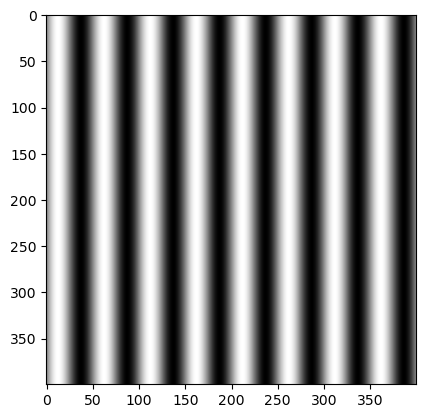

In [3]:
N = 400 # drawing size
x = np.linspace(-1, 1, num = N) # x values
y = x # y values
f = 4 # frequency

X,Y = np.meshgrid(x,y) # create mesh grid
R = np.sin(2 * np.pi * f * X) # find sin wave values
R_normalized = 255 * (R + 1) / 2 # normalize the values
sin_x = np.zeros(np.shape(R_normalized))
sin_x = R_normalized

plt.imshow(sin_x, cmap = 'gray')

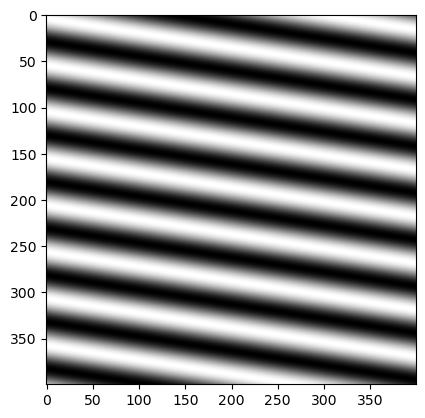

In [4]:
theta = 30
z = np.sin(2 * np.pi * f * (Y * np.sin(theta) + X * np.cos(theta)))

plt.imshow(z, cmap='gray')

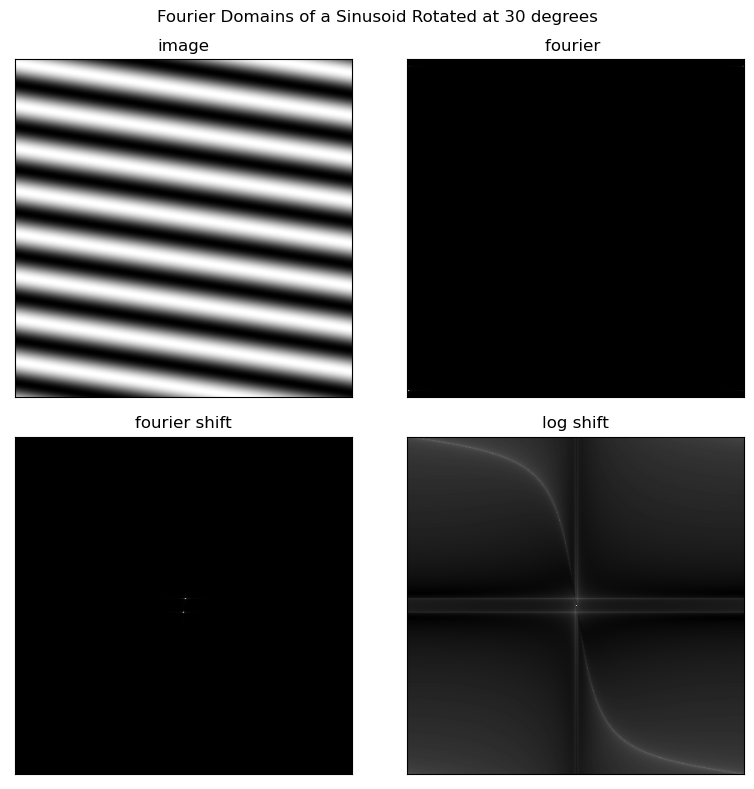

In [5]:
def fourier_(img, title):
    
    imgf = np.fft.fft2(img)
    imgf_shift = np.fft.fftshift(imgf)
    
    fig, ax = plt.subplots(2,2, figsize = (8,8))

    ax[0][0].imshow(img, cmap='gray')
    ax[0][0].set_title('image')
    ax[0][0].set_xticks([])
    ax[0][0].set_yticks([])
    ax[0][1].imshow(abs(imgf), cmap = 'gray')
    ax[0][1].set_title('fourier ')
    ax[0][1].set_xticks([])
    ax[0][1].set_yticks([])
    ax[1][0].imshow(abs(imgf_shift), cmap = 'gray')
    ax[1][0].set_title('fourier shift')
    ax[1][0].set_xticks([])
    ax[1][0].set_yticks([])
    ax[1][1].imshow(abs(np.log(imgf_shift)), cmap = 'gray')
    ax[1][1].set_title('log shift')
    ax[1][1].set_xticks([])
    ax[1][1].set_yticks([])

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
    
    return

fourier_(z, 'Fourier Domains of a Sinusoid Rotated at 30 degrees')

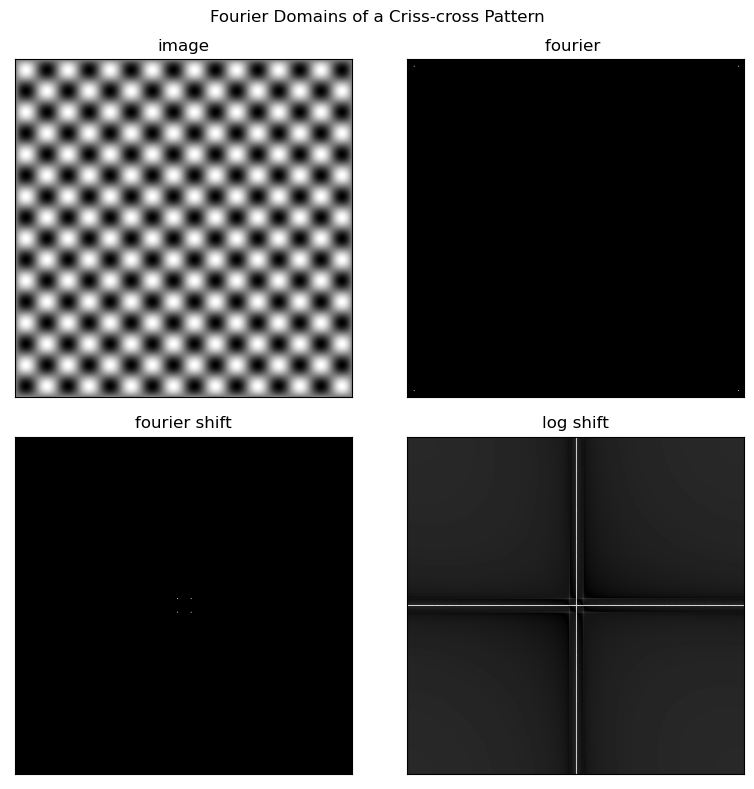

In [6]:
N = 400 # drawing size
x = np.linspace(-1, 1, num = N) # x values
y = x # y values
f = 4 # frequency

crisscross = np.sin(2 * np.pi * f * X) * np.sin(2 * np.pi * f * Y)
fourier_(crisscross, 'Fourier Domains of a Criss-cross Pattern')

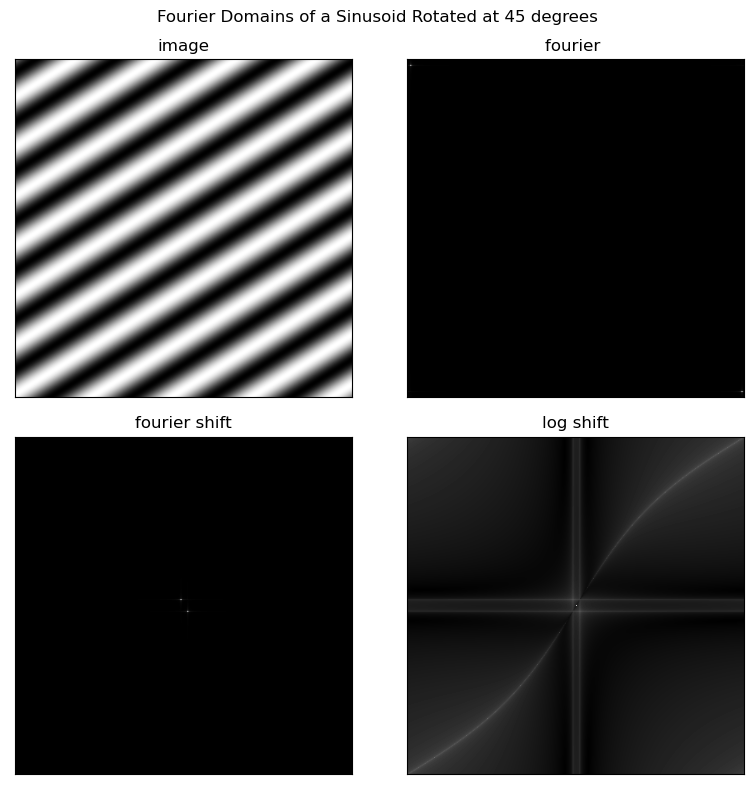

In [7]:
theta = 45
z = np.sin(2 * np.pi * f * (Y * np.sin(theta) + X * np.cos(theta)))
fourier_(z, 'Fourier Domains of a Sinusoid Rotated at 45 degrees')

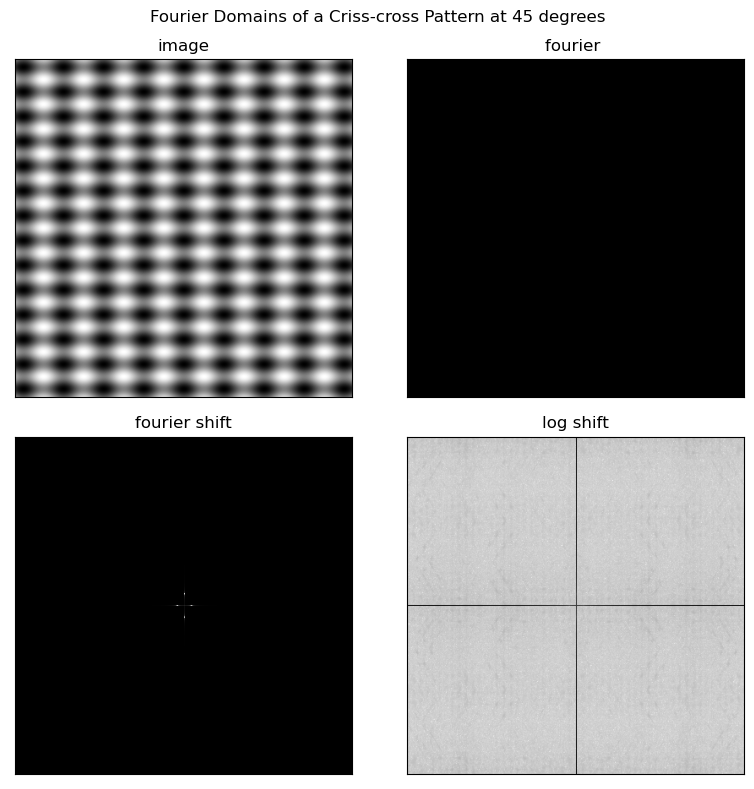

In [8]:
z = np.sin(2 * np.pi * f * (Y * np.sin(theta) + X * np.cos(theta))) * np.sin(2 * np.pi * f * (Y * np.sin(-theta) + X * np.cos(-theta)))
fourier_(z, 'Fourier Domains of a Criss-cross Pattern at 45 degrees')

## 2.2.2 Canvas Weave Modeling and Removal

In [9]:
def rgb2gray(rgb):
    """
    converts rgb image to grayscale
    """
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

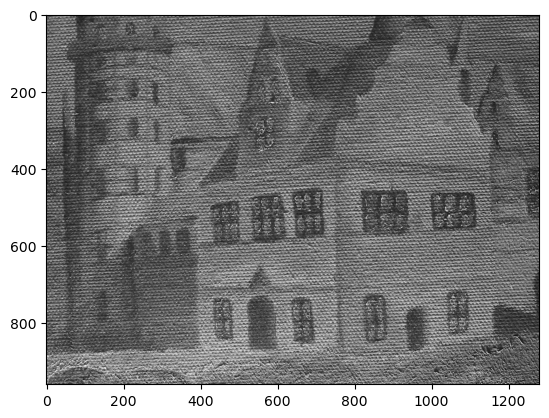

In [10]:
house_colored = plt.imread('185-8526_IMG.JPG')
house = rgb2gray(house_colored)
plt.imshow(house, cmap='gray')

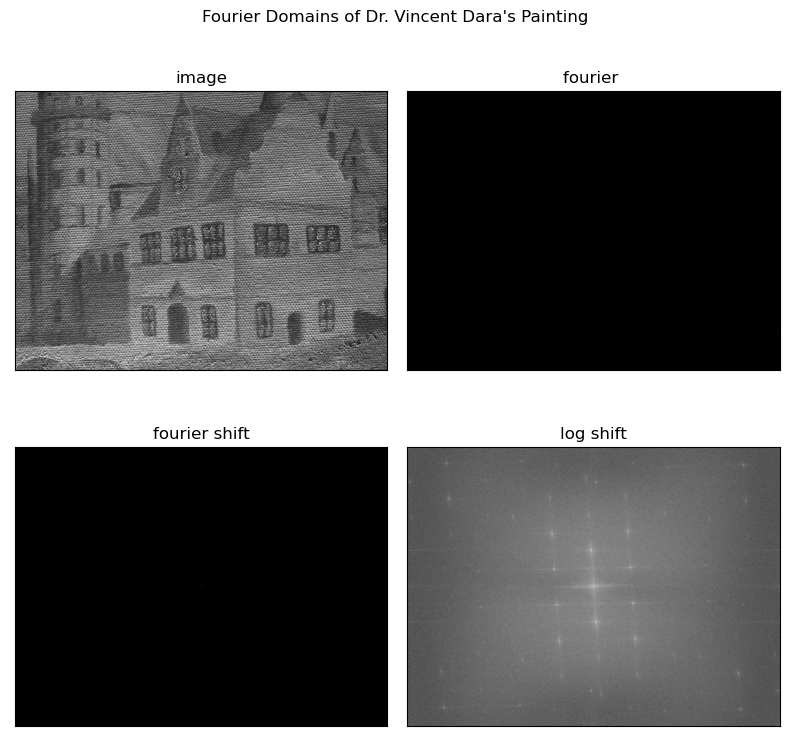

In [11]:
fourier_(house, 'Fourier Domains of Dr. Vincent Dara\'s Painting')

/var/folders/fj/cbg9yb3557sf2mgd7q1czp5w0000gn/T/ipykernel_26855/1506594551.py:21: RuntimeWarning: divide by zero encountered in log
  ax[1][0].imshow(np.abs(np.log(mask_shift*img_f)), cmap='gray')


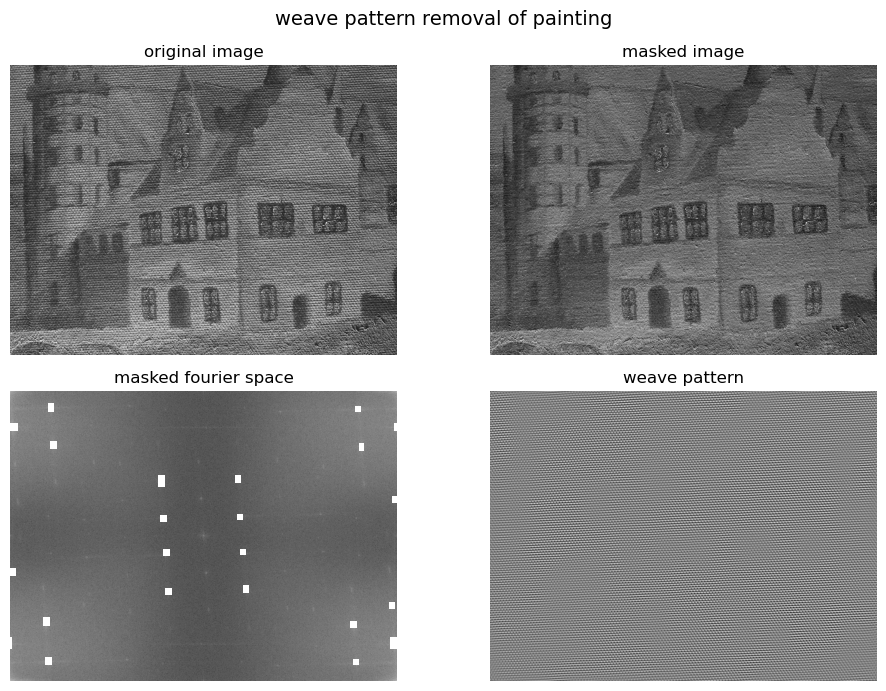

In [12]:
# import mask

mask = rgb2gray(plt.imread('mask1.png'))


# apply mask on fourier domain

mask_shift = np.fft.fftshift(mask)
img_f = np.fft.fft2(house)
mask_img = np.abs(np.fft.ifft2(mask_shift*img_f))


# show images and compare result to orginal

fig, ax = plt.subplots(2,2, figsize = (10, 7))

ax[0][0].imshow(house, cmap='gray')
ax[0][0].set_title('original image')
ax[0][1].imshow(mask_img, cmap='gray')
ax[0][1].set_title('masked image')
ax[1][0].imshow(np.abs(np.log(mask_shift*img_f)), cmap='gray')
ax[1][0].set_title('masked fourier space')
ax[1][1].imshow(house-mask_img, cmap='gray')
ax[1][1].set_title('weave pattern')

plt.suptitle('weave pattern removal of painting', size = 14)

for i in range(2):
    for j in range(2):
        ax[i][j].axis('off')
        
plt.tight_layout()

In [13]:
# function for masking

def maskimage(image, mask):
    
    mask_shift = np.fft.fftshift(mask)
    img_f = np.fft.fft2(image)
    mask_img = np.abs(np.fft.ifft2(mask_shift*img_f))
    
    return mask_img


# apply masking in separate rgb channels

house_r = house_colored[...,0]
mask_r = maskimage(house_r, mask)

house_g = house_colored[...,1]
mask_g = maskimage(house_g, mask)

house_b = house_colored[...,2]
mask_b= maskimage(house_b, mask)


masked_coloredhouse = np.copy(house_colored)
masked_coloredhouse[...,0] = mask_r
masked_coloredhouse[...,1] = mask_g
masked_coloredhouse[...,2] = mask_b

/var/folders/fj/cbg9yb3557sf2mgd7q1czp5w0000gn/T/ipykernel_26855/4195710818.py:1: RuntimeWarning: divide by zero encountered in log
  np.abs(np.log(mask_shift*img_f))
/var/folders/fj/cbg9yb3557sf2mgd7q1czp5w0000gn/T/ipykernel_26855/4195710818.py:11: RuntimeWarning: divide by zero encountered in log
  ax[1][0].imshow(abs(np.log(mask_shift*img_f)), cmap='gray')


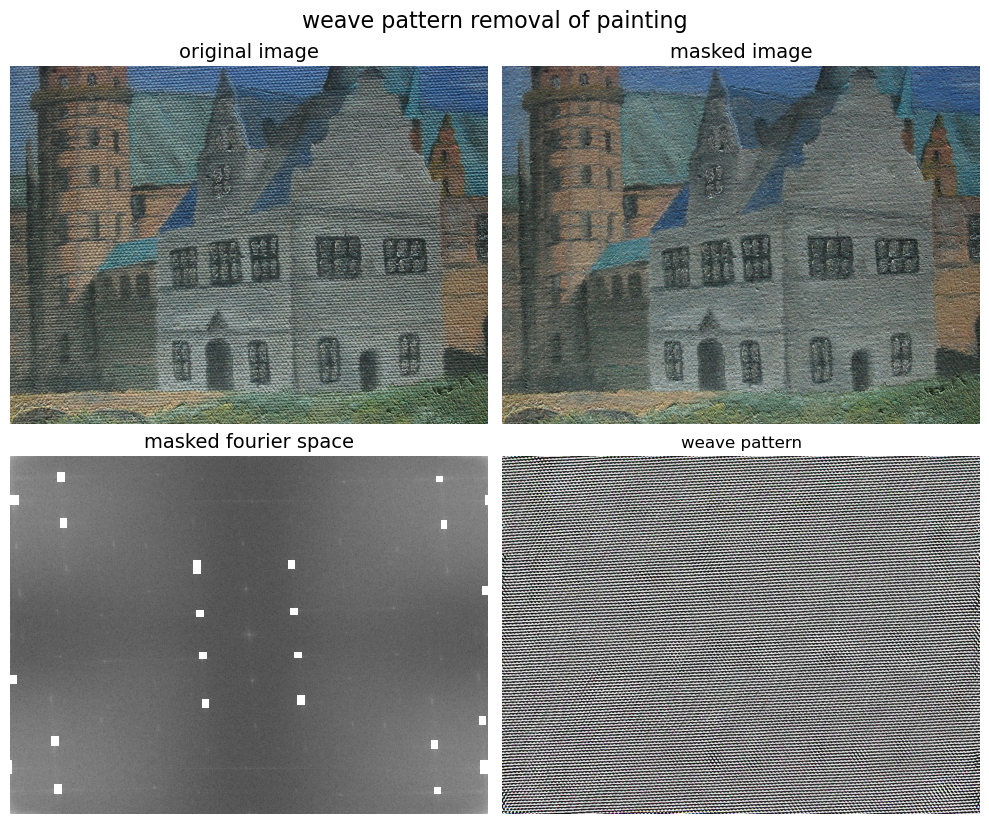

In [17]:
np.abs(np.log(mask_shift*img_f))

# show images and compare result to orginal

fig, ax = plt.subplots(2,2, figsize = (10, 8.5))

ax[0][0].imshow(house_colored)
ax[0][0].set_title('original image', size = 14)
ax[0][1].imshow(masked_coloredhouse)
ax[0][1].set_title('masked image', size = 14)
ax[1][0].imshow(abs(np.log(mask_shift*img_f)), cmap='gray')
ax[1][0].set_title('masked fourier space', size = 14)
ax[1][1].imshow(house_colored - masked_coloredhouse)
ax[1][1].set_title('weave pattern')

plt.suptitle('weave pattern removal of painting', size = 16)

for i in range(2):
    for j in range(2):
        ax[i][j].axis('off')
        
plt.tight_layout()

### Extracting print in a canvas tote bag 

(-0.5, 2903.5, 893.5, -0.5)

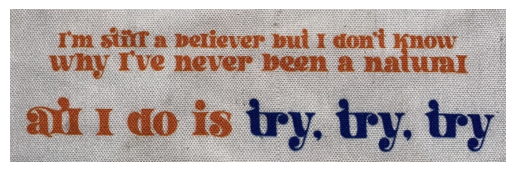

In [18]:
mirrorball = mpimg.imread('IMG_3676.JPG')
plt.imshow(mirrorball)
plt.axis('off')

In [19]:
mb_r = mirrorball[...,0] 
mb_g = mirrorball[...,1] 
mb_b = mirrorball[...,2] 

In [20]:
np.fft.fftshift(np.fft.fft2(mb_r)).shape

(894, 2904)

(-0.5, 2903.5, 893.5, -0.5)

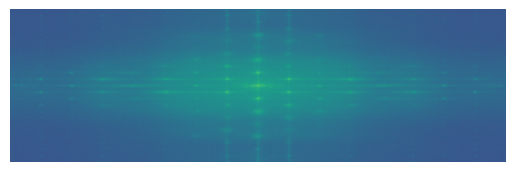

In [21]:
plt.imshow(abs(np.log(np.fft.fftshift(np.fft.fft2(mb_r)))))
plt.axis('off')

In [24]:
mask2 = rgb2gray(mpimg.imread('mask2.png'))

In [25]:
mirrorball_mask = np.copy(mirrorball)

mirrorball_mask[...,0]  = maskimage(mirrorball[...,0], mask2)
mirrorball_mask[...,1]  = maskimage(mirrorball[...,1], mask2)
mirrorball_mask[...,2]  = maskimage(mirrorball[...,2], mask2)

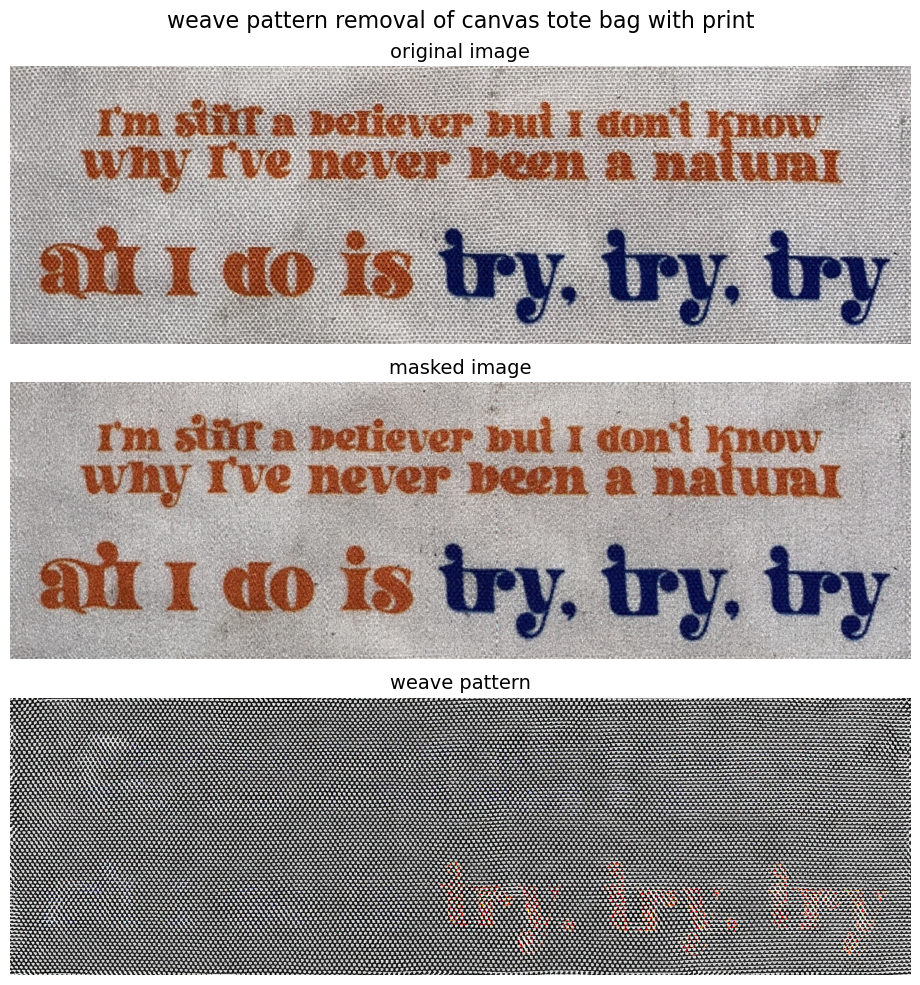

In [26]:
fig, ax = plt.subplots(3, figsize = (10,10))

ax[0].imshow(mirrorball)
ax[0].axis('off')
ax[0].set_title('original image', size = 14)
ax[1].imshow(mirrorball_mask)
ax[1].axis('off')
ax[1].set_title('masked image', size = 14)
ax[2].imshow(mirrorball - mirrorball_mask)
ax[2].axis('off')
ax[2].set_title('weave pattern', size = 14)

plt.suptitle('weave pattern removal of canvas tote bag with print', size = 16)
plt.tight_layout()

### Extracting print in fabric

In [27]:
fabric = mpimg.imread('IMG_3669.JPG')

(-0.5, 2073.5, 2052.5, -0.5)

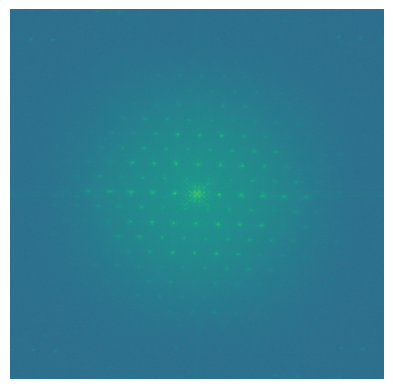

In [28]:
fabric_r = fabric[...,0] 
fabric_g = fabric[...,1] 
fabric_b = fabric[...,2] 

plt.imshow(abs(np.log(np.fft.fftshift(np.fft.fft2(fabric_r)))))
plt.axis('off')

In [29]:
mask3 = rgb2gray(mpimg.imread('mask3.png'))

In [30]:
fabric_mask = np.copy(fabric)

fabric_mask[...,0]  = maskimage(fabric[...,0], mask3)
fabric_mask[...,1]  = maskimage(fabric[...,1], mask3)
fabric_mask[...,2]  = maskimage(fabric[...,2], mask3)

/var/folders/fj/cbg9yb3557sf2mgd7q1czp5w0000gn/T/ipykernel_26855/599177907.py:9: RuntimeWarning: divide by zero encountered in log
  ax[1][0].imshow(np.abs(np.log(mask3*np.fft.fftshift(np.fft.fft2(fabric[...,0])))), cmap='gray')


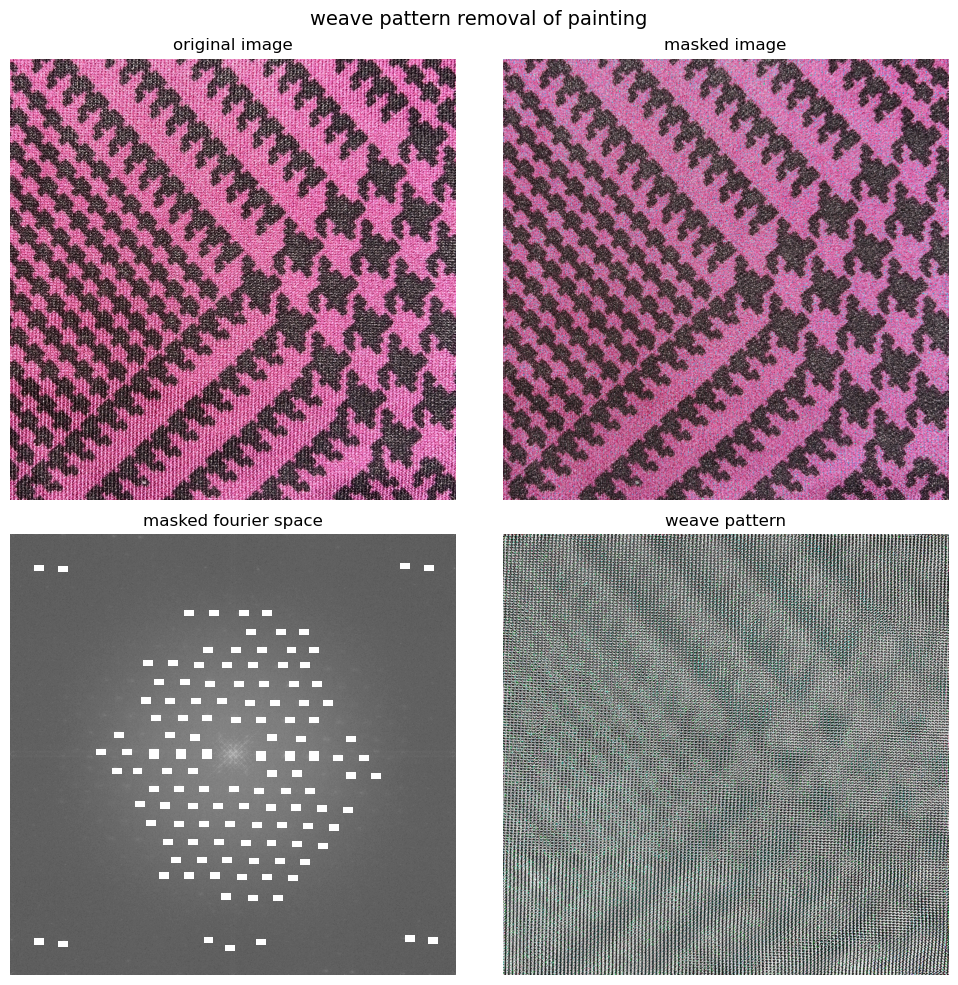

In [31]:
# show images and compare result to orginal

fig, ax = plt.subplots(2,2, figsize = (10, 10))

ax[0][0].imshow(fabric, cmap='gray')
ax[0][0].set_title('original image')
ax[0][1].imshow(fabric_mask, cmap='gray')
ax[0][1].set_title('masked image')
ax[1][0].imshow(np.abs(np.log(mask3*np.fft.fftshift(np.fft.fft2(fabric[...,0])))), cmap='gray')
ax[1][0].set_title('masked fourier space')
ax[1][1].imshow(fabric - fabric_mask, cmap='gray')
ax[1][1].set_title('weave pattern')

plt.suptitle('weave pattern removal of painting', size = 14)

for i in range(2):
    for j in range(2):
        ax[i][j].axis('off')
        
plt.tight_layout()

## 2.2.3 Convolution Theorem Redux

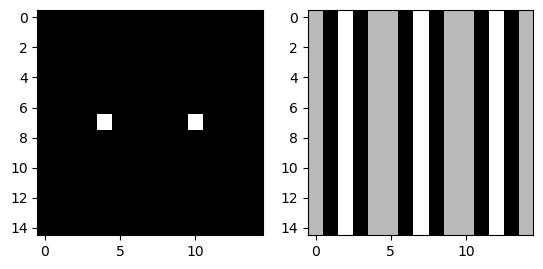

In [32]:
twodots = np.zeros((15,15))
twodots[7,4] = 1
twodots[7,10] = 1

f_twodots = np.fft.fftshift(np.fft.fft2(twodots))

fig, ax  = plt.subplots(1, 2)

ax[0].imshow(twodots, cmap = 'gray')
ax[1].imshow(abs(f_twodots), cmap = 'gray')

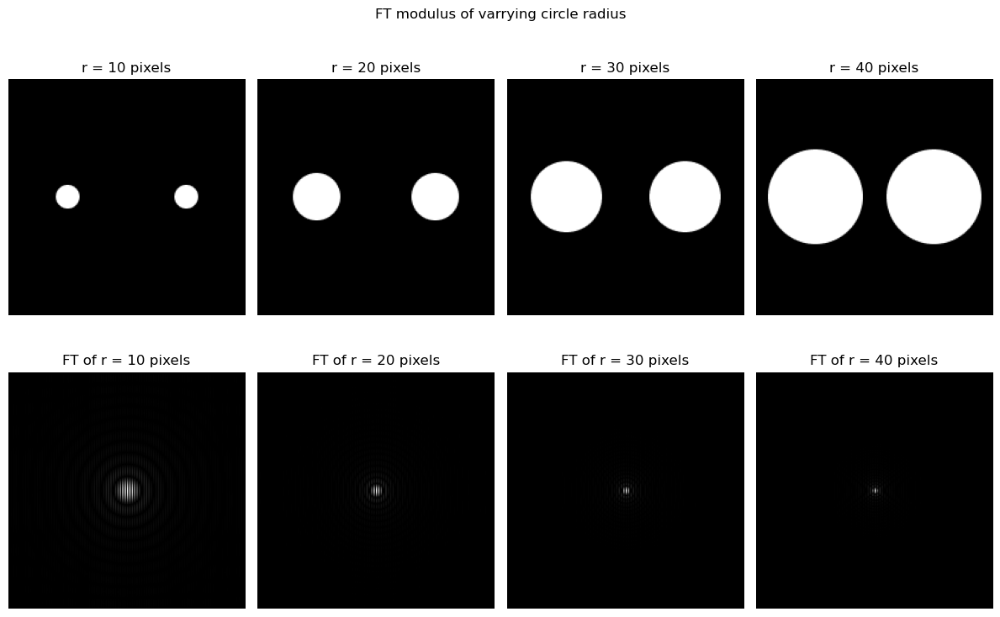

In [33]:
def fshift(img):
    return np.fft.fftshift(np.fft.fft2(img))

r10 = rgb2gray(mpimg.imread('r10.png'))
r20 = rgb2gray(mpimg.imread('r20.png'))
r30 = rgb2gray(mpimg.imread('r30.png'))
r40 = rgb2gray(mpimg.imread('r40.png'))

fig, ax = plt.subplots(2, 4, figsize = (12, 8))

ax[0][0].imshow(r10, cmap = 'gray')
ax[0][0].axis('off')
ax[0][0].set_title('r = 10 pixels')
ax[0][1].imshow(r20, cmap = 'gray')
ax[0][1].axis('off')
ax[0][1].set_title('r = 20 pixels')
ax[0][2].imshow(r30, cmap = 'gray')
ax[0][2].axis('off')
ax[0][2].set_title('r = 30 pixels')
ax[0][3].imshow(r40, cmap = 'gray')
ax[0][3].axis('off')
ax[0][3].set_title('r = 40 pixels')

ax[1][0].imshow(abs(fshift(r10)), cmap = 'gray')
ax[1][0].axis('off')
ax[1][0].set_title('FT of r = 10 pixels')
ax[1][1].imshow(abs(fshift(r20)), cmap = 'gray')
ax[1][1].axis('off')
ax[1][1].set_title('FT of r = 20 pixels')
ax[1][2].imshow(abs(fshift(r30)), cmap = 'gray')
ax[1][2].axis('off')
ax[1][2].set_title('FT of r = 30 pixels')
ax[1][3].imshow(abs(fshift(r40)), cmap = 'gray')
ax[1][3].axis('off')
ax[1][3].set_title('FT of r = 40 pixels')


plt.suptitle('FT modulus of varrying circle radius')
plt.tight_layout()

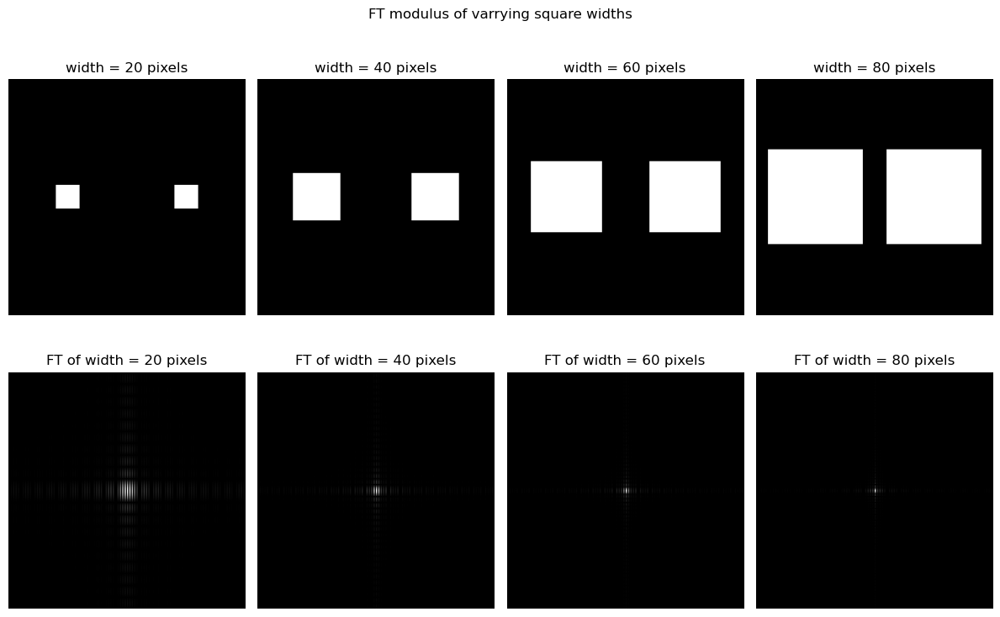

In [34]:
def fshift(img):
    return np.fft.fftshift(np.fft.fft2(img))

w20 = rgb2gray(mpimg.imread('w20.png'))
w40 = rgb2gray(mpimg.imread('w40.png'))
w60 = rgb2gray(mpimg.imread('w60.png'))
w80 = rgb2gray(mpimg.imread('w80.png'))

fig, ax = plt.subplots(2, 4, figsize = (12, 8))

ax[0][0].imshow(w20, cmap = 'gray')
ax[0][0].axis('off')
ax[0][0].set_title('width = 20 pixels')
ax[0][1].imshow(w40, cmap = 'gray')
ax[0][1].axis('off')
ax[0][1].set_title('width = 40 pixels')
ax[0][2].imshow(w60, cmap = 'gray')
ax[0][2].axis('off')
ax[0][2].set_title('width = 60 pixels')
ax[0][3].imshow(w80, cmap = 'gray')
ax[0][3].axis('off')
ax[0][3].set_title('width = 80 pixels')

ax[1][0].imshow(abs(fshift(w20)), cmap = 'gray')
ax[1][0].axis('off')
ax[1][0].set_title('FT of width = 20 pixels')
ax[1][1].imshow(abs(fshift(w40)), cmap = 'gray')
ax[1][1].axis('off')
ax[1][1].set_title('FT of width = 40 pixels')
ax[1][2].imshow(abs(fshift(w60)), cmap = 'gray')
ax[1][2].axis('off')
ax[1][2].set_title('FT of width = 60 pixels')
ax[1][3].imshow(abs(fshift(w80)), cmap = 'gray')
ax[1][3].axis('off')
ax[1][3].set_title('FT of width = 80 pixels')


plt.suptitle('FT modulus of varrying square widths')
plt.tight_layout()

In [35]:
A = np.zeros((200,200))

np.random.seed(18)

x = np.random.randint(200, size = 10) 
y = np.random.randint(200, size = 10)
 
for i in range(10):
    j = x[i]
    k = y[i]
    A[j][k] = 1

d = np.zeros((200,200))

for i in range(95, 105):
    for j in range(95, 105):
        
        #if (i % 2 == 0):
            
        d[i][j] = 1

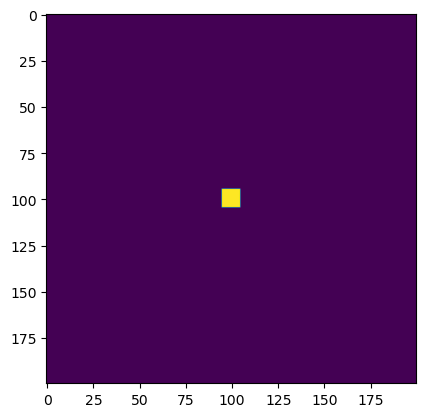

In [36]:
plt.imshow(d)

In [37]:
pls = rgb2gray(mpimg.imread('pls.png'))

In [39]:
def convolution(img, lens):
    
    Fshift_lens = np.fft.fftshift(lens)
    Fimg = np.fft.fft2(img)

    multiplied = Fimg * Fshift_lens
    i_multiplied = np.fft.ifft2(multiplied)
    
    return i_multiplied

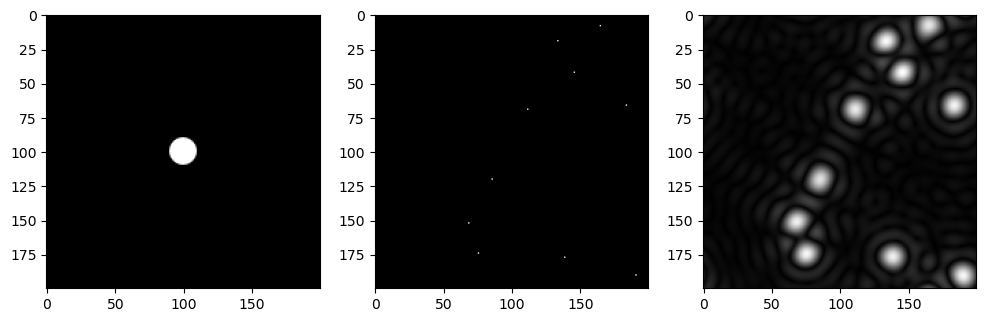

In [40]:
Ad = convolution(A, pls)

fig, ax = plt.subplots(1, 3, figsize = (12, 4))

ax[0].imshow(pls, cmap = 'gray')
ax[1].imshow(A, cmap = 'gray')
ax[2].imshow(abs(Ad), cmap = 'gray')

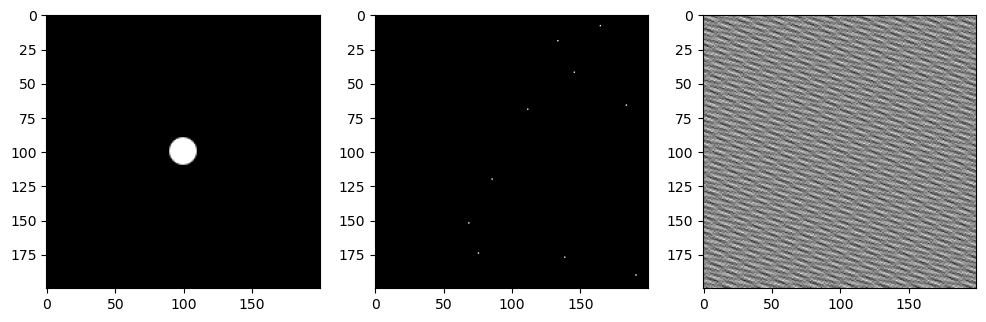

In [41]:
Ad = convolution(pls, A)

fig, ax = plt.subplots(1, 3, figsize = (12, 4))

ax[0].imshow(pls, cmap = 'gray')
ax[1].imshow(A, cmap = 'gray')
ax[2].imshow(abs(Ad), cmap = 'gray')

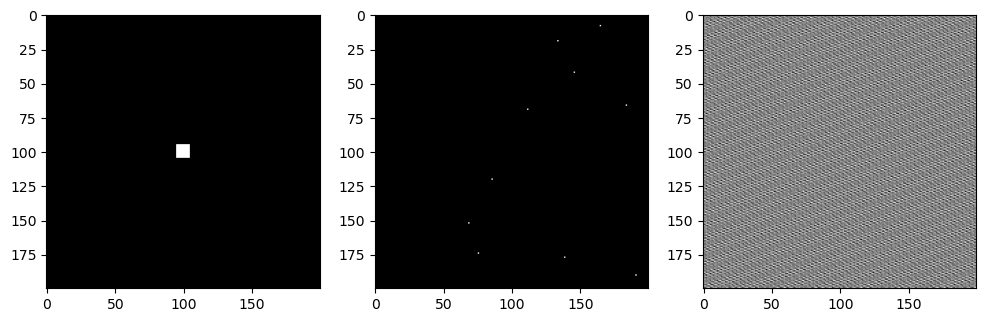

In [42]:
Ad = convolution(d, A)

fig, ax = plt.subplots(1, 3, figsize = (12, 4))

ax[0].imshow(d, cmap = 'gray')
ax[1].imshow(A, cmap = 'gray')
ax[2].imshow(abs(Ad), cmap = 'gray')

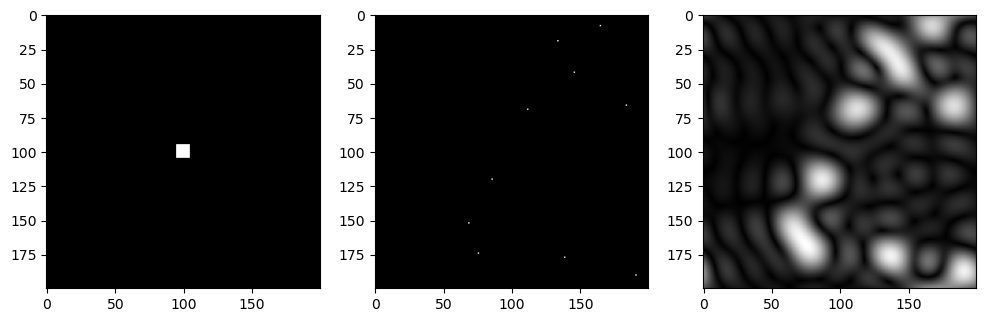

In [43]:
Ad = convolution(A, d)

fig, ax = plt.subplots(1, 3, figsize = (12, 4))

ax[0].imshow(d, cmap = 'gray')
ax[1].imshow(A, cmap = 'gray')
ax[2].imshow(abs(Ad), cmap = 'gray')